In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2017



In [3]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-1.48,-1.85,-1.89,-1.87,-1.68,-1.59,-1.49,-1.12,-0.87,-0.69,-0.74,0.31
1,1.0,-1.46,-1.76,-1.76,-1.71,-1.61,-1.52,-1.41,-1.12,-0.85,-0.72,-0.73,0.11
2,1.5,-1.41,-1.66,-1.61,-1.54,-1.51,-1.44,-1.33,-1.10,-0.80,-0.72,-0.71,-0.04
3,2.0,-1.32,-1.53,-1.45,-1.36,-1.39,-1.32,-1.21,-1.04,-0.73,-0.68,-0.65,-0.12
4,2.5,-1.19,-1.37,-1.27,-1.17,-1.24,-1.18,-1.09,-0.94,-0.63,-0.60,-0.56,-0.12


In [4]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000,200.000000,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,1.395250,1.377850,1.301550,1.196950,1.07210,1.097850,0.974950,0.91520,1.054450,0.966350,0.989100,0.911350
std,28.939592,0.660435,0.720339,0.671781,0.613772,0.60243,0.594389,0.547991,0.49422,0.434904,0.403226,0.396572,0.247546
min,0.500000,-1.480000,-1.850000,-1.890000,-1.870000,-1.68000,-1.590000,-1.490000,-1.12000,-0.870000,-0.720000,-0.740000,-0.120000
25%,25.375000,1.447500,1.417500,1.350000,1.247500,1.09750,1.120000,0.987500,0.91750,1.070000,0.980000,1.000000,0.910000
50%,50.250000,1.650000,1.660000,1.555000,1.420000,1.30500,1.330000,1.190000,1.11000,1.220000,1.120000,1.140000,1.010000
75%,75.125000,1.720000,1.740000,1.630000,1.490000,1.38000,1.400000,1.260000,1.19000,1.280000,1.180000,1.192500,1.050000
max,100.000000,1.750000,1.780000,1.670000,1.530000,1.42000,1.440000,1.300000,1.22000,1.310000,1.210000,1.220000,1.070000


In [5]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,12.906043,14.347425,13.110942,11.757123,12.130704,11.965163,11.209887,10.425477,8.852751,8.314259,8.036457,5.322902
Jan,12.906043,0.436175,0.475547,0.443277,0.404291,0.397380,0.392173,0.361254,0.325009,0.286745,0.265693,0.261547,0.160239
Feb,14.347425,0.475547,0.518888,0.483585,0.440999,0.433776,0.428047,0.394502,0.355057,0.313010,0.290002,0.285433,0.174751
Mar,13.110942,0.443277,0.483585,0.451290,0.412059,0.404418,0.399016,0.367530,0.330273,0.291734,0.269997,0.266020,0.161914
Apr,11.757123,0.404291,0.440999,0.412059,0.376716,0.368978,0.363981,0.335081,0.300687,0.266094,0.246007,0.242632,0.146869
May,12.130704,0.397380,0.433776,0.404418,0.368978,0.362922,0.358051,0.330017,0.297015,0.261904,0.242564,0.238799,0.146007
June,11.965163,0.392173,0.428047,0.399016,0.363981,0.358051,0.353298,0.325629,0.293122,0.258435,0.239405,0.235645,0.144221
July,11.209887,0.361254,0.394502,0.367530,0.335081,0.330017,0.325629,0.300294,0.270511,0.238220,0.220750,0.217181,0.133132
Aug,10.425477,0.325009,0.355057,0.330273,0.300687,0.297015,0.293122,0.270511,0.244253,0.214578,0.199125,0.195629,0.120882
Sept,8.852751,0.286745,0.313010,0.291734,0.266094,0.261904,0.258435,0.238220,0.214578,0.189141,0.175262,0.172453,0.105759


In [6]:
df.var()

Matuarity    837.500000
Jan            0.436175
Feb            0.518888
Mar            0.451290
Apr            0.376716
May            0.362922
June           0.353298
July           0.300294
Aug            0.244253
Sept           0.189141
Oct            0.162591
Nov            0.157270
Dec            0.061279
dtype: float64

In [7]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-1.48,-1.85,-1.89,-1.87,-1.68,-1.59,-1.49,-1.12,-0.87,-0.69,-0.74,0.31
1,1.0,-1.46,-1.76,-1.76,-1.71,-1.61,-1.52,-1.41,-1.12,-0.85,-0.72,-0.73,0.11
2,1.5,-1.41,-1.66,-1.61,-1.54,-1.51,-1.44,-1.33,-1.10,-0.80,-0.72,-0.71,-0.04
3,2.0,-1.32,-1.53,-1.45,-1.36,-1.39,-1.32,-1.21,-1.04,-0.73,-0.68,-0.65,-0.12
4,2.5,-1.19,-1.37,-1.27,-1.17,-1.24,-1.18,-1.09,-0.94,-0.63,-0.60,-0.56,-0.12


In [8]:
name = df.columns[1:]

In [9]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [10]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

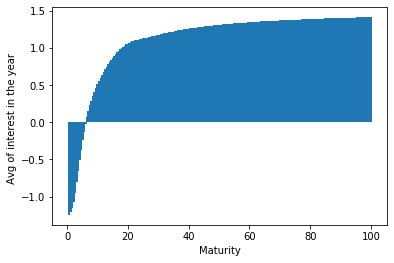

In [11]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 45
weeks

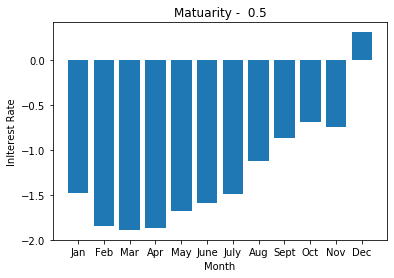

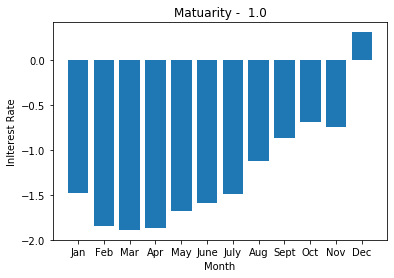

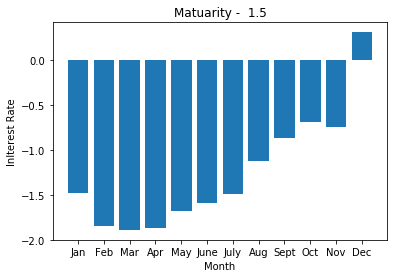

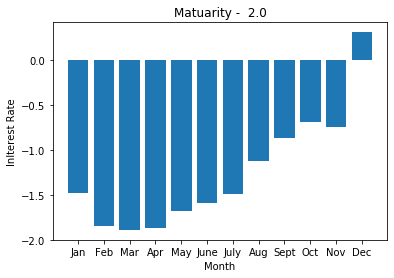

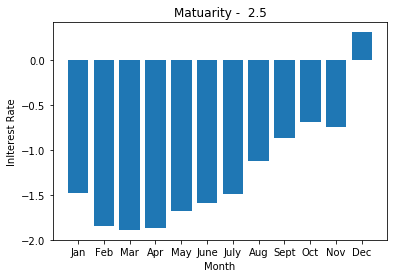

...

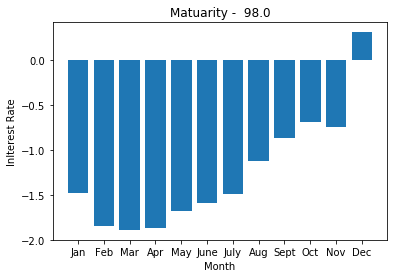

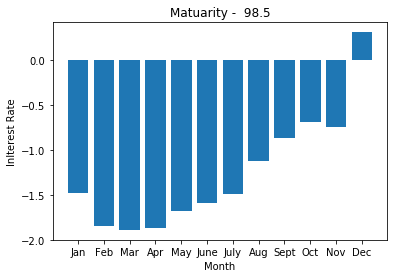

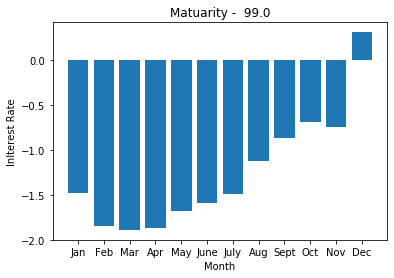

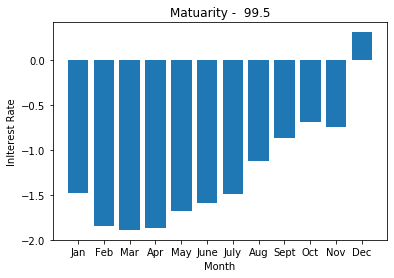

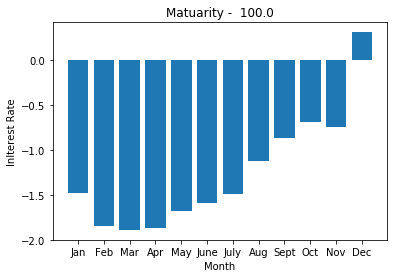

In [12]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

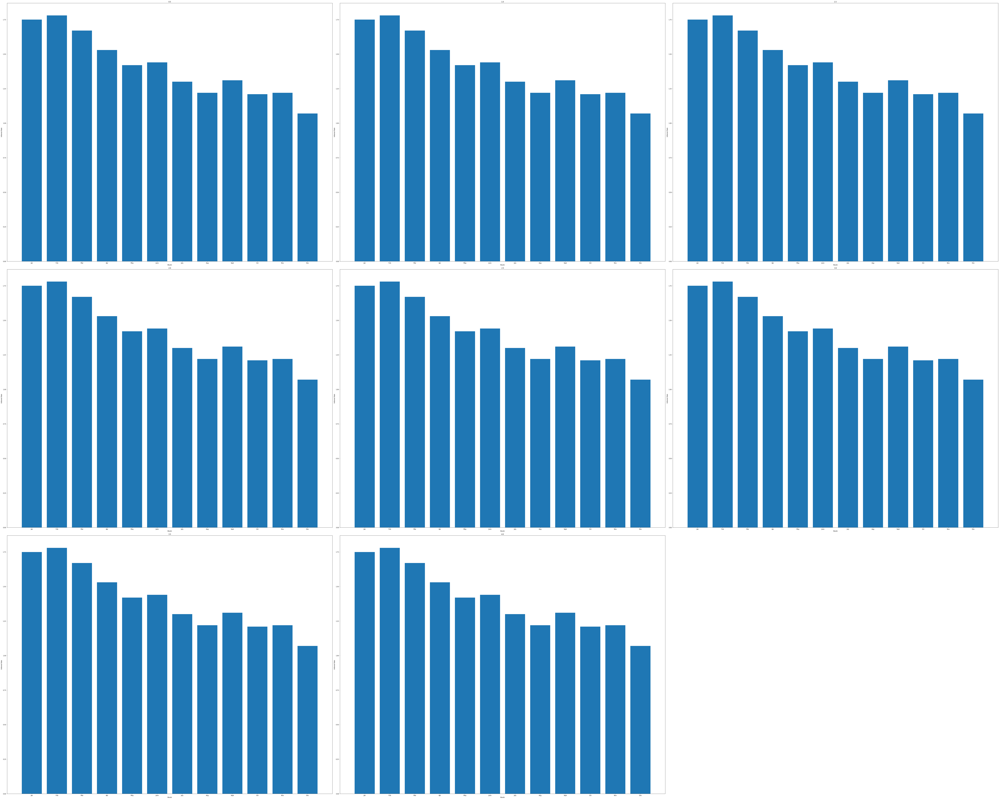

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

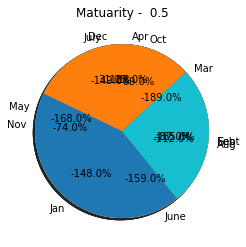

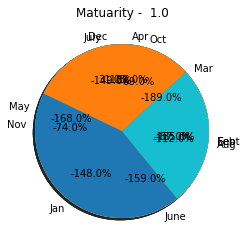

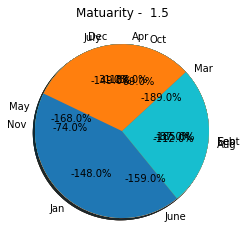

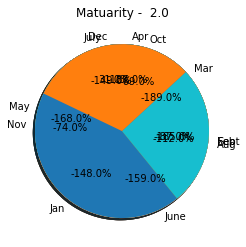

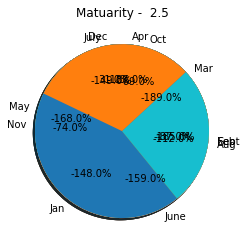

...

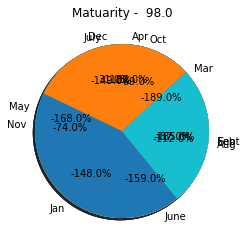

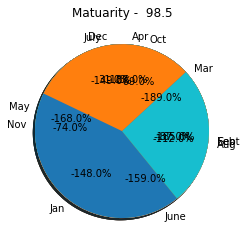

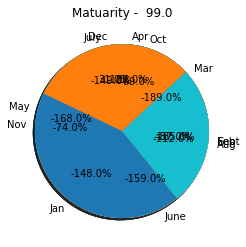

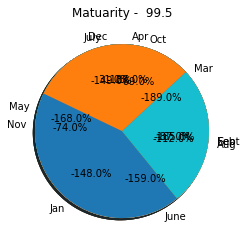

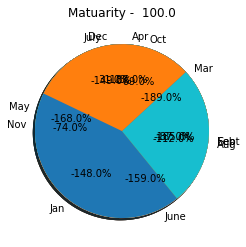

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

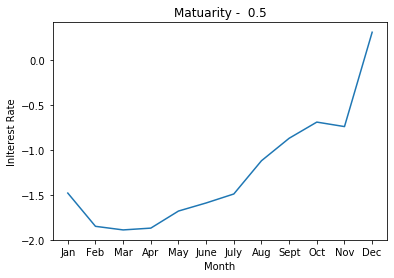

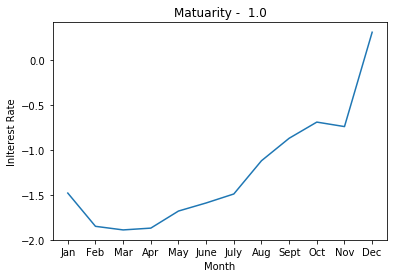

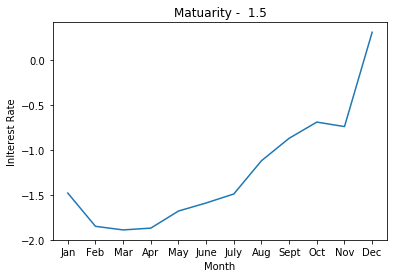

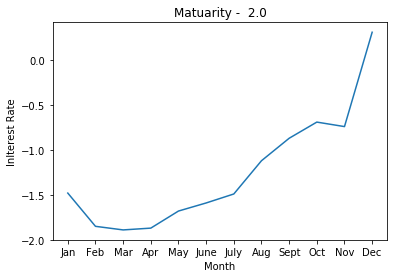

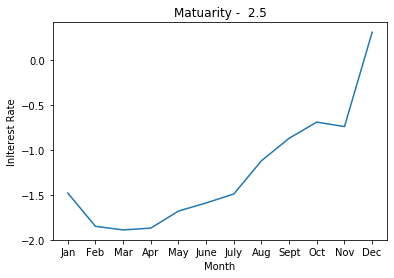

...

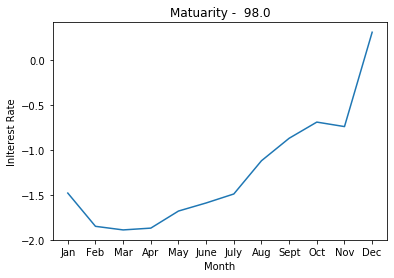

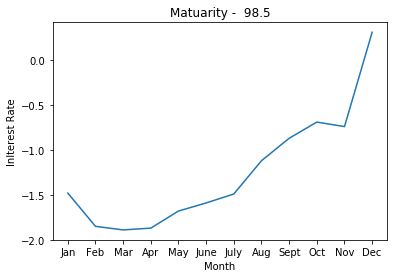

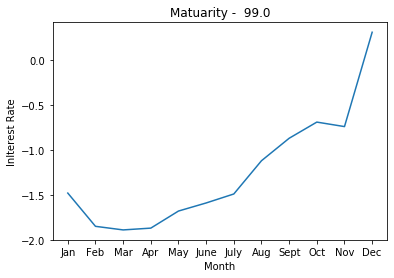

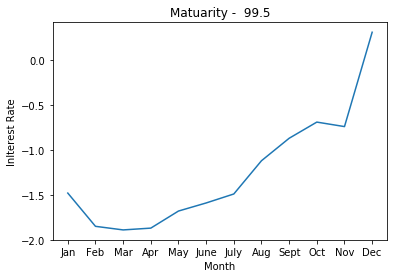

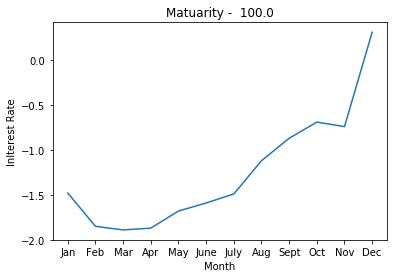

In [15]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

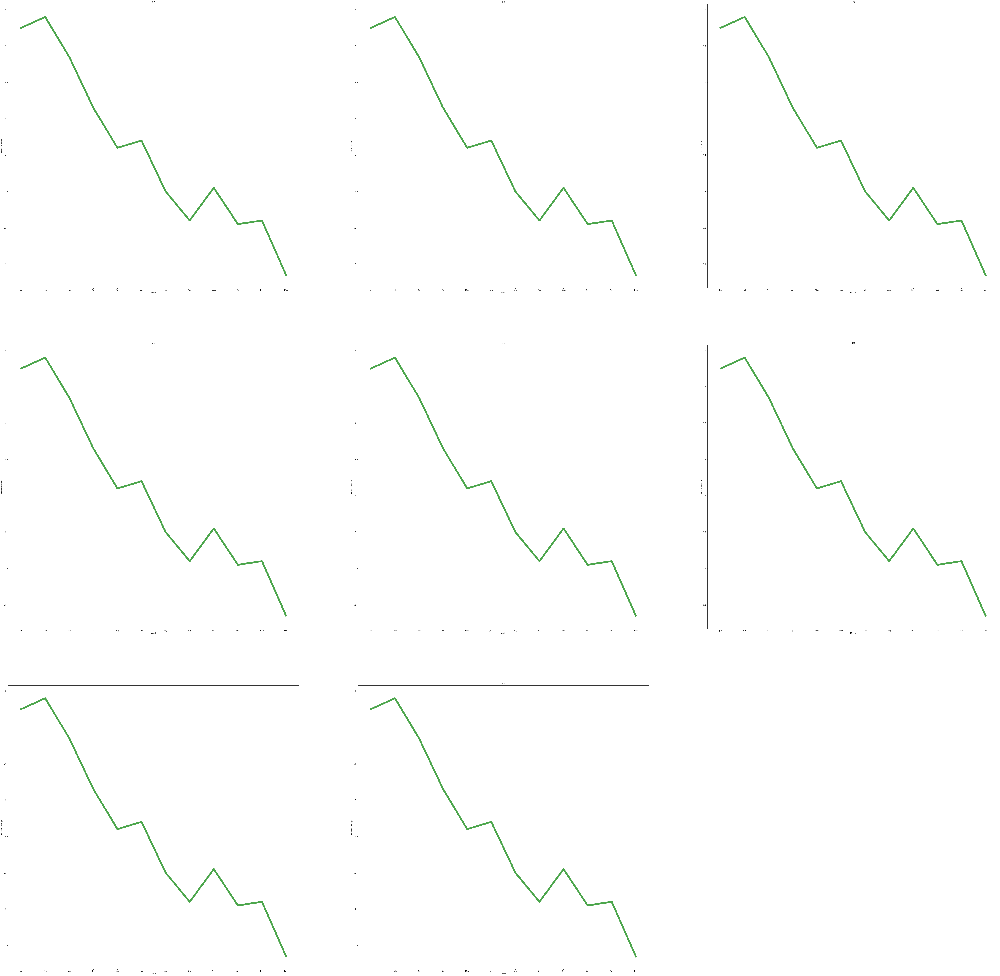

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [17]:
df['sum'].sum()/200

1.1044125